# Overview

Attempting the same model ([ResNet34](https://pytorch.org/vision/main/models/resnet.html)), same [WikiArt](https://datasets.activeloop.ai/docs/ml/datasets/wiki-art-dataset/) samples, [Deep Lake Vector Search](https://docs.activeloop.ai/example-code/tutorials/vector-store/image-similarity-search), and same test inputs that my groupmate Austin used. This time utilizing Data Augmentation and Edge Detection techniques to possibly improve the search algorithm in finding more similar images to the input test images.

No data except for the test inputs will be included as the folders for WikiArt will be automatically created like in the first iteration of the ResNet model testing.

## Conclusions from first ResNet Testing:

* Vector Embeddings will be the slowest part of the process; if we can have a saved version of the embeddings, eveything else will be faster.
* WikiArt has a lot of art that needs some cleaning.
* It should be very easy to get the closest images if we use the vector embeddings.


## Data Augmentation and Edge Detection Conclusions:

* asd


# Imports

In [5]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import torch
from torch import nn
import deeplake
from torchvision import transforms, models, datasets
import flask
from deeplake.core.vectorstore.deeplake_vectorstore import VectorStore
import os
import torch
from torchvision.models.feature_extraction import create_feature_extractor
from PIL import Image
import shutil
import imageio.v2 as imageio

## Load Data

In [3]:
# Load WikiArt
ds = deeplake.load('hub://activeloop/wiki-art')


# Create transform
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
])

dataloader = ds.pytorch(transform=transform, batch_size=32, shuffle=True, tensors=['images', 'labels'])

/

Opening dataset in read-only mode as you don't have write permissions.


/

This dataset can be visualized in Jupyter Notebook by ds.visualize() or at https://app.activeloop.ai/activeloop/wiki-art



-

hub://activeloop/wiki-art loaded successfully.



c:\Users\xusha\anaconda3\envs\dsan6600\Lib\site-packages\deeplake\integrations\pytorch\common.py:137: UserWarning: Decode method for tensors ['images'] is defaulting to numpy. Please consider specifying a decode_method in .pytorch() that maximizes the data preprocessing speed based on your transformation.
  warnings.warn(


## Visualize Data

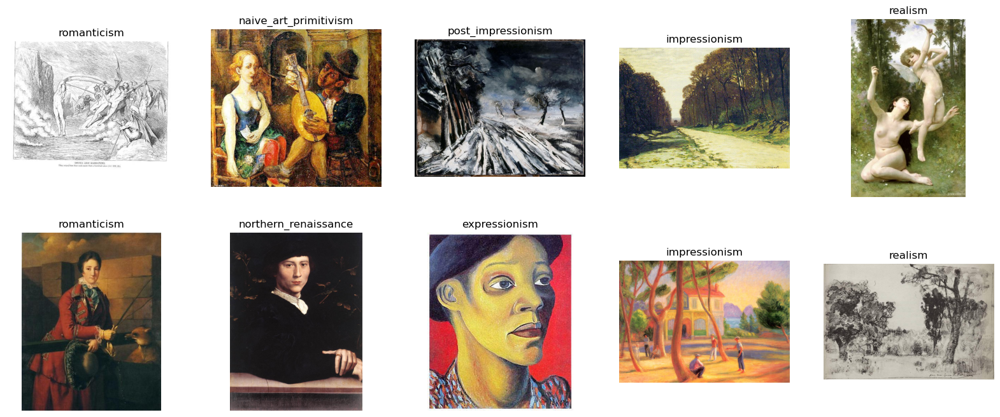

In [4]:
# Show the first 10 images

# Create a grid of images
fig, ax = plt.subplots(2, 5, figsize=(20, 8))

# Get 10 random indices
indices = range(0, len(ds))
indices = np.random.choice(indices, 10, replace=False)
indices = [int(i) for i in indices]

# Plot the images
for i, index in enumerate(indices):
    img = ds.images[index].numpy()
    label = ds.labels[index].data()
    title = label['text'][0]
    ax[i // 5, i % 5].imshow(img)
    ax[i // 5, i % 5].set_title(title)
    ax[i // 5, i % 5].axis('off')

In [5]:
ds.summary()

Dataset(path='hub://activeloop/wiki-art', read_only=True, tensors=['images', 'labels'])

 tensor      htype                 shape               dtype  compression
 -------    -------               -------             -------  ------- 
 images      image     (81433, 50:9541, 63:15530, 3)   uint8    jpeg   
 labels   class_label           (81433, 1)            uint32    None   


In [6]:
ds.visualize()

HINT: Please forward the port - 51269 to your local machine, if you are running on the cloud.
 * Serving Flask app 'dataset_visualizer'


 * Debug mode: off


# Create Model

## Import ResNet Model

Here I use 34, but 18 was also ok. Anything larger is too big to run on my laptop.

In [2]:
from torchvision.models.feature_extraction import create_feature_extractor

# Check if GPU is available
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

# Load the model
model = models.resnet34(pretrained=True)

# Create a feature extractor
return_nodes = {
    'avgpool': 'embedding'
}
model = create_feature_extractor(model, return_nodes=return_nodes)

# Freeze the model
model.eval()
model.to(device)

c:\Users\xusha\anaconda3\envs\dsan6600\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\xusha\anaconda3\envs\dsan6600\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet34_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet34_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Module(
    (0): Module(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): Module(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2):

## Create Image Embeddings

In [4]:
# Image transformation
# From https://docs.activeloop.ai/example-code/tutorials/vector-store/image-similarity-search
tform= transforms.Compose([
    transforms.Resize((224,224)), 
    transforms.ToTensor(),
    transforms.Lambda(lambda x: torch.cat([x, x, x], dim=0) if x.shape[0] == 1 else x),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225]),
])

# From https://docs.activeloop.ai/example-code/tutorials/vector-store/image-similarity-search
def embedding_function(images, model = model, transform = tform, batch_size = 4):
    """Creates a list of embeddings based on a list of image filenames. Images are processed in batches."""

    if isinstance(images, str):
        images = [images]

    # Proceess the embeddings in batches, but return everything as a single list
    embeddings = []
    for i in range(0, len(images), batch_size):
        batch = torch.stack([transform(Image.open(item)) for item in images[i:i+batch_size]])
        batch = batch.to(device)
        with torch.no_grad():
            embeddings+= model(batch)['embedding'][:,:,0,0].cpu().numpy().tolist()

    return embeddings

### Create Vector Store

In [6]:
from deeplake.core.vectorstore.deeplake_vectorstore import VectorStore

# Path to the vector store
vector_store_path = 'vector_store/'

# Empty the vector store
## Will get an error if it has anything in it
if os.path.exists(vector_store_path):
    shutil.rmtree(vector_store_path)
os.makedirs(vector_store_path)

# Create the vector store
vector_store = VectorStore(
    path = vector_store_path,
    tensor_params = [{'name': 'image', 'htype': 'image', 'sample_compression': 'jpg'}, 
                     {'name': 'embedding', 'htype': 'embedding'}, 
                     {'name': 'filename', 'htype': 'text'}],
)

### Save Images to be used in the Vector Store

In [10]:
from tqdm import tqdm

# List of styles that are not too abstract for testing (i.e. they have people in them)
good_styles = ['baroque', 'expressionism', 'impressionism', 'neoclassicism', 'romanticism']

# Empty images folder
os.system('rm -rf images')

# Create images folder
os.system('mkdir images')

# Get indices of images with good styles
good_indices = [i for i in range(len(ds)) if ds.labels[i].data()['text'][0] in good_styles]

# Save 1000 images with good styles

# sample 1000 images
image_indices = np.random.choice(good_indices, 5000, replace=False)

# Save images
for i, sample in enumerate(tqdm(image_indices)):

    # Make sure i is an integer for indexing
    i = int(i)

    # Save image
    image = ds.images[i].numpy()
    label = ds.labels[i].data()['text'][0]

    # Save image
    plt.imsave(f'images/{label}_{i}.jpg', image)
    

c:\Users\xusha\anaconda3\envs\dsan6600\Lib\site-packages\deeplake\core\tensor.py:714: UserWarning: Indexing by integer in a for loop, like `for i in range(len(ds)): ... ds.tensor[i]` can be quite slow. Use `for i, sample in enumerate(ds)` instead.
  warnings.warn(
100%|██████████| 5000/5000 [04:30<00:00, 18.46it/s] 


### Get Image Embeddings

In [37]:
import os

# Get all image filenames
images_path = 'images/'
image_fns = [os.path.join(images_path, item) for item in os.listdir(images_path) if os.path.splitext(item)[-1]=='.jpg']
image_fns[:5]

['images/abstract_expressionism_0.jpg',
 'images/abstract_expressionism_1.jpg',
 'images/abstract_expressionism_10.jpg',
 'images/abstract_expressionism_100.jpg',
 'images/abstract_expressionism_1000.jpg']

Note: This is the heaviest part. Will take a while to run and get that computer fan spinning.

In [10]:
# Add to vector store
vector_store.add(image = image_fns,
                 filename = image_fns,
                 embedding_function = embedding_function, 
                 embedding_data = image_fns)


Creating 5000 embeddings in 10 batches of size 500::   0%|          | 0/10 [00:00<?, ?it/s]

# Results

Super quick since the embeddings are already created.

In [4]:
# Function to get results and plot them
## k = number of similar images to get
def get_results(image_path,  k=5):

    # Get results from vector store
    result = vector_store.search(embedding_data=image_path, embedding_function=embedding_function, k=k)

    # Get image name of the first image
    image_name = os.path.basename(image_path)

    # Plot one image and the 5 most similar images
    fig, ax = plt.subplots(1, k+1, figsize=(20, 4))
    ax[0].imshow(plt.imread(image_path))
    ax[0].set_title('Query Image: ' + image_name)
    ax[0].axis('off')

    for i in range(k):

        # Get image data
        label = result['filename'][i]

        label = label.rstrip('.jpg').split('/')[-1]
        
        # Remove any numbers
        label = ''.join([i for i in label if not i.isdigit()])

        # Remove any underscores
        label = label.replace('_', ' ')

        img = result['image'][i]
        similarity = result['score'][i]

        # Plot image
        ax[i+1].imshow(img)
        ax[i+1].set_title(f'Similar Image {i+1}\nType: {label}\nScore: {similarity:.3f}')
        ax[i+1].axis('off')

    # Show plot
    plt.show()

In [9]:
# Get images in test-images folder
test_images = [os.path.join('../data/test-images', item) for item in os.listdir('../data/test-images') if os.path.splitext(item)[-1]=='.jpg']

# Get results for each image
for image in test_images:
    get_results(image)

ValueError: specified dataset is empty

# Trying Again but with Greyscale Images

In [26]:
images_paths = [os.path.join('images', item) for item in os.listdir('images') if os.path.splitext(item)[-1]=='.jpg']
images_paths[:5]

['images/art_nouveau_modern_4482.jpg',
 'images/abstract_expressionism_1303.jpg',
 'images/abstract_expressionism_1465.jpg',
 'images/abstract_expressionism_996.jpg',
 'images/action_painting_2879.jpg']

In [27]:
grey_image_path = 'grey-images'

# Empty grey images folder
os.system(f'rm -rf {grey_image_path}')

# Create grey images folder
os.system(f'mkdir {grey_image_path}')

# Convert images to grey scale
for i, image_path in enumerate(tqdm(images_paths)):

    # Load image
    img = plt.imread(image_path)

    # Convert to grey scale
    grey_img = np.dot(img[...,:3], [0.2989, 0.5870, 0.1140])

    # Save image
    plt.imsave(f'{grey_image_path}/{os.path.basename(image_path)}', grey_img, cmap='gray')


100%|██████████| 5000/5000 [04:14<00:00, 19.61it/s]


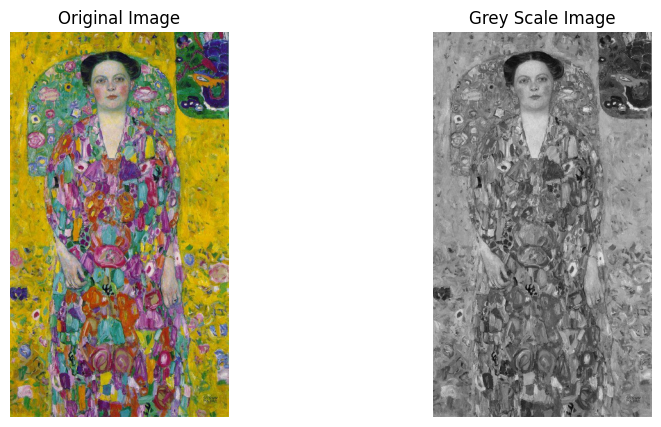

In [29]:
# Show an image and its grey scale version
fig, ax = plt.subplots(1, 2, figsize=(10, 5))

# Load image
img = plt.imread(images_paths[0])
grey_img = plt.imread(os.path.join(grey_image_path, os.path.basename(images_paths[0])))

# Plot image
ax[0].imshow(img)
ax[0].set_title('Original Image')
ax[0].axis('off')

# Plot grey image
ax[1].imshow(grey_img, cmap='gray')
ax[1].set_title('Grey Scale Image')
ax[1].axis('off')

# Show plot
plt.show()

In [30]:
from deeplake.core.vectorstore.deeplake_vectorstore import VectorStore

# Path to the vector store
grey_vector_store_path = 'grey_vector_store/'

# Empty the vector store
## Will get an error if it has anything in it
if os.path.exists(vector_store_path):
    os.system(f'rm -r {vector_store_path}')
os.makedirs(vector_store_path)

# Create the vector store
grey_vector_store = VectorStore(
    path = grey_vector_store_path,
    tensor_params = [{'name': 'image', 'htype': 'image', 'sample_compression': 'jpg'}, 
                     {'name': 'embedding', 'htype': 'embedding'}, 
                     {'name': 'filename', 'htype': 'text'}],
)

In [32]:
import os

# Get all image filenames
grey_images_path = 'grey-images/'
grey_image_fns = [os.path.join(grey_images_path, item) for item in os.listdir(grey_images_path) if os.path.splitext(item)[-1]=='.jpg']
grey_image_fns[:5]

['grey-images/art_nouveau_modern_4482.jpg',
 'grey-images/abstract_expressionism_1303.jpg',
 'grey-images/abstract_expressionism_1465.jpg',
 'grey-images/abstract_expressionism_996.jpg',
 'grey-images/action_painting_2879.jpg']

In [33]:
# Add to vector store
grey_vector_store.add(image = grey_image_fns,
                 filename = grey_image_fns,
                 embedding_function = embedding_function, 
                 embedding_data = grey_image_fns)

Creating 5000 embeddings in 10 batches of size 500:: 100%|██████████| 10/10 [08:31<00:00, 51.14s/it]

Dataset(path='grey_vector_store/', tensors=['image', 'embedding', 'filename', 'id'])

  tensor      htype                shape               dtype  compression
  -------    -------              -------             -------  ------- 
   image      image    (5000, 116:6215, 103:5360, 3)   uint8    jpeg   
 embedding  embedding           (5000, 512)           float32   None   
 filename     text               (5000, 1)              str     None   
    id        text               (5000, 1)              str     None   


In [35]:
# Convert test images to grey scale
test_images = [os.path.join('../data/test-images', item) for item in os.listdir('../data/test-images') if os.path.splitext(item)[-1]=='.jpg']

# Create grey test images folder
os.system('rm -rf ../data/grey-test-images')

# Check if folder exists
if not os.path.exists('../data/grey-test-images'):

    # Create folder
    os.system('mkdir ../data/grey-test-images')

# Convert images to grey scale
for i, image_path in enumerate(tqdm(test_images)):

    # Load image
    img = plt.imread(image_path)

    # Convert to grey scale
    grey_img = np.dot(img[...,:3], [0.2989, 0.5870, 0.1140])

    # Save image
    plt.imsave(f'../data/grey-test-images/{os.path.basename(image_path)}', grey_img, cmap='gray')

100%|██████████| 10/10 [00:00<00:00, 10.02it/s]


In [36]:
# Function to get results and plot them
## k = number of similar images to get
def grey_get_results(image_path,  k=5):

    # Get results from vector store
    result = grey_vector_store.search(embedding_data=image_path, embedding_function=embedding_function, k=k)

    # Get image name of the first image
    image_name = os.path.basename(image_path)

    color_image_path = image_path.replace('grey-test-images', 'test-images')

    # Plot one image and the 5 most similar images
    fig, ax = plt.subplots(1, k+1, figsize=(20, 4))
    ax[0].imshow(plt.imread(color_image_path))
    ax[0].set_title('Query Image: ' + image_name)
    ax[0].axis('off')

    for i in range(k):

        # Get image data
        filename = result['filename'][i]

        # Get colored image
        filename = filename.replace('grey-images', 'images')
        color_image = plt.imread(filename)
        
        # Remove any numbers
        label = filename.rstrip('.jpg').split('/')[-1]
        label = ''.join([i for i in label if not i.isdigit()])

        # Remove any underscores
        label = label.replace('_', ' ')
        similarity = result['score'][i]

        # Plot image
        ax[i+1].imshow(color_image)
        ax[i+1].set_title(f'Similar Image {i+1}\nType: {label}\nScore: {similarity:.3f}')
        ax[i+1].axis('off')

    # Show plot
    plt.show()

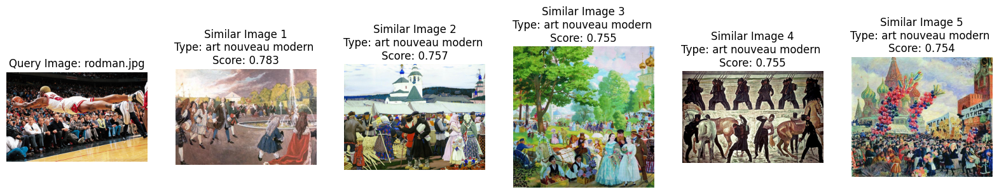

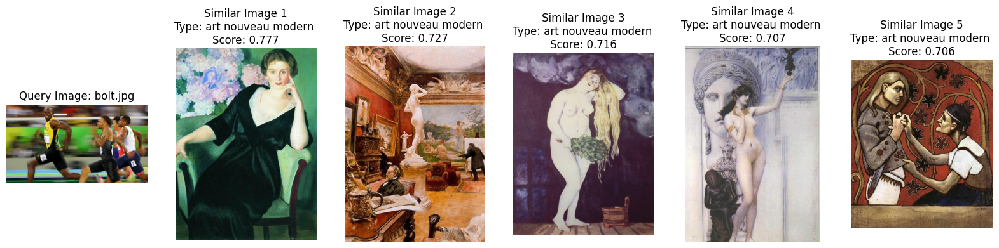

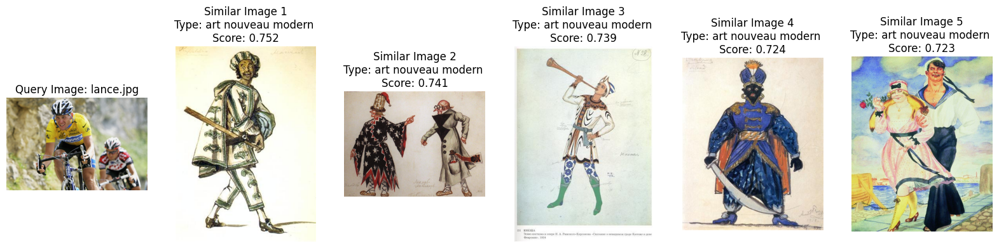

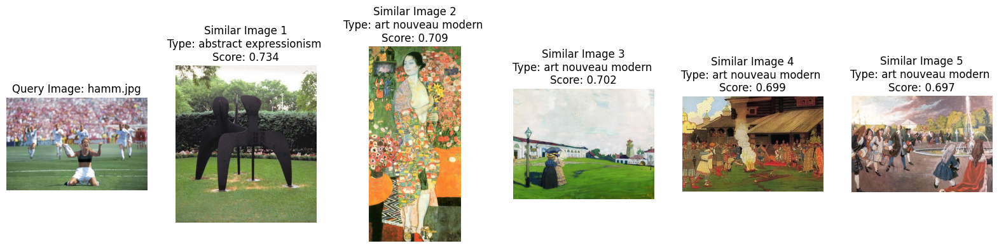

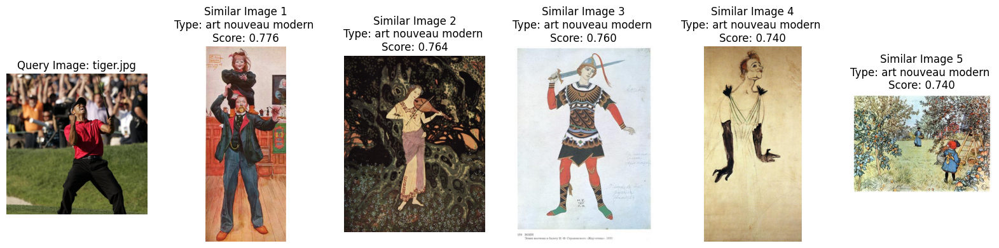

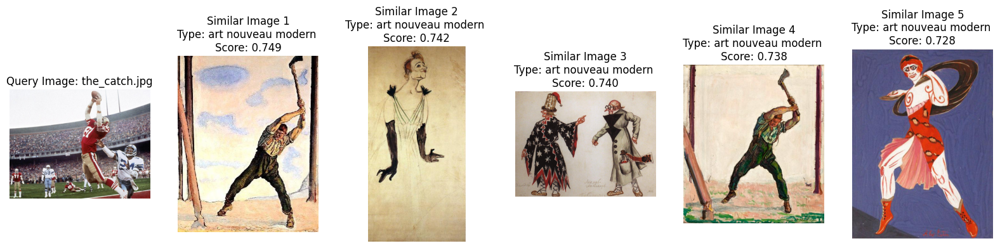

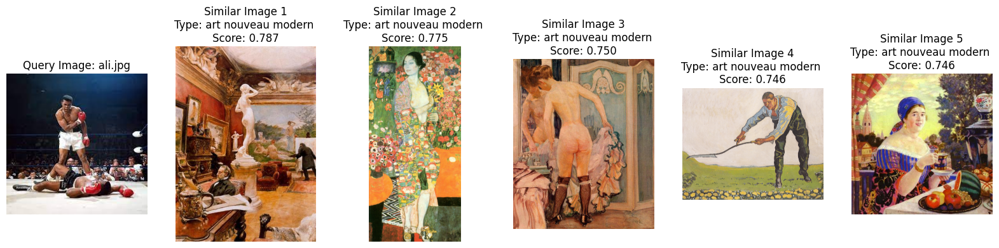

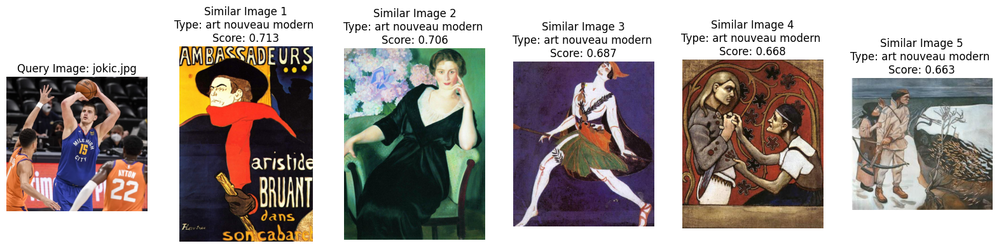

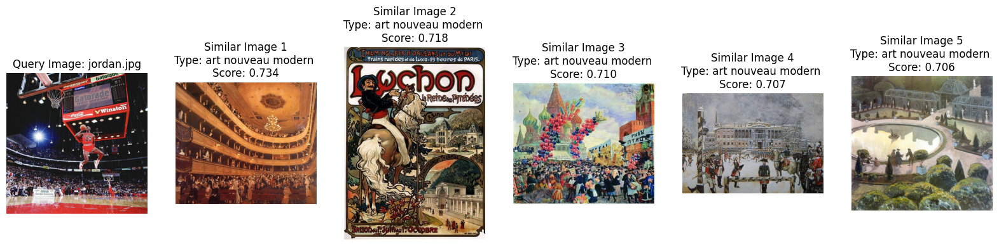

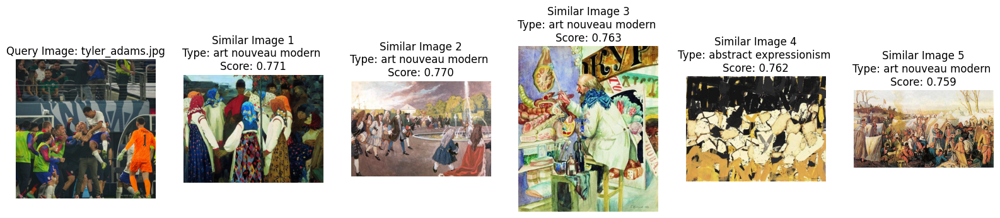

In [37]:
# Get images in test-images folder
grey_test_images = [os.path.join('../data/grey-test-images', item) for item in os.listdir('../data/grey-test-images') if os.path.splitext(item)[-1]=='.jpg']

# Get results for each image
for image in grey_test_images:
    grey_get_results(image)

# Trying Edge Detection Now

In [2]:
"""
Works off of the original saved images.
Save original image paths then create edge-image directories to store edge detected images
"""

#get original images paths
images_paths = [os.path.join('images', item) for item in os.listdir('images') if os.path.splitext(item)[-1]=='.jpg']
images_paths[:5]

#create 'edge-images' directory to store
edge_image_path = 'edge-images'
if os.path.exists(edge_image_path):
    shutil.rmtree(edge_image_path)
os.makedirs(edge_image_path)




In [15]:
"""
Define function that will be used for multiprocessing later.
Function should be written to process 1 image.
"""

#Edge detections steps mainly from: https://www.geeksforgeeks.org/python-edge-detection-using-pillow/

#define function to read and edge detect images
def edge_detect(image_path):

    from PIL import Image, ImageFilter
    
    #load image from path
    image = Image.open(image_path)
    #convert to greyscale as edge detection needs greyscale
    image = image.convert('L')
    #detect edges
    image = image.filter(ImageFilter.FIND_EDGES)

    return image, image_path

In [ ]:
"""
Use Pool() parallel processing to convert original images to edge detection ones.

Did this on Windows OS and Python 3.12.2
"""

#apply Pool() for multiprocessing
# Steps from: https://www.kaggle.com/code/rsmits/using-multiprocessing-for-image-preprocessing

import multiprocess as mp

#get cpu count:
cpu_count = mp.cpu_count()

#make pool of workers
pool = mp.Pool(processes=cpu_count)

#parallel preprocess and save into edge_image folder
for edge_img, path in pool.starmap(edge_detect, [(path,) for path in images_paths]):
    plt.imsave(f'{edge_image_path}/{os.path.basename(path)}', edge_img)

#close pool of workers
pool.close()
pool.join()

## Shawn's Attempt: 
## 2m 13s to preprocess into edge-detection images


In [23]:
"""
For my own curiosity, I wanted to see how much slower it is to do preprocessing without parallel
processing. 
So I will do a simple for-loop to process each image individually into the same folder

****************SKIP THIS IF ACTUALLY PREPROCESSING****************
"""

#recreate 'edge-images' directory to store
edge_image_path = 'edge-images'
if os.path.exists(edge_image_path):
    shutil.rmtree(edge_image_path)
os.makedirs(edge_image_path)

# Convert images to grey scale
from PIL import Image, ImageFilter
from tqdm import tqdm

for i, image_path in enumerate(tqdm(images_paths)):

    # load, convert to greyscale, detect edges
    image = Image.open(image_path)
    image = image.convert('L')
    edge_image = image.filter(ImageFilter.FIND_EDGES)

    # Save image
    plt.imsave(f'{edge_image_path}/{os.path.basename(image_path)}', edge_image)


## Shawn's Attempt: 
## 2m 59s with simple for-loop. Parallel processing was 46 second faster with 5000 samples!


100%|██████████| 5000/5000 [02:58<00:00, 28.04it/s] 


In [11]:
"""
Make edge detected image vector store similar to before:
"""

# edge vector store path
edge_vector_store_path = 'edge_vector_store/'

# Empty the vector store
## Will get an error if it has anything in it
if os.path.exists(edge_vector_store_path):
    os.system(f'rm -r {edge_vector_store_path}')
os.makedirs(edge_vector_store_path)

# Create the vector store
edge_vector_store = VectorStore(
    path = edge_vector_store_path,
    tensor_params = [{'name': 'image', 'htype': 'image', 'sample_compression': 'jpg'}, 
                     {'name': 'embedding', 'htype': 'embedding'}, 
                     {'name': 'filename', 'htype': 'text'}],
)

In [8]:
"""
Get all edge image filenames
"""

edge_images_path = 'edge-images/'
edge_image_fns = [os.path.join(edge_images_path, item) for item in os.listdir(edge_images_path) if os.path.splitext(item)[-1]=='.jpg']
edge_image_fns[:5]

['edge-images/abstract_expressionism_0.jpg',
 'edge-images/abstract_expressionism_1.jpg',
 'edge-images/abstract_expressionism_10.jpg',
 'edge-images/abstract_expressionism_100.jpg',
 'edge-images/abstract_expressionism_1000.jpg']

In [12]:
"""
Add to edge vector store
"""

edge_vector_store.add(image = edge_image_fns,
                 filename = edge_image_fns,
                 embedding_function = embedding_function, 
                 embedding_data = edge_image_fns)

Creating 5000 embeddings in 10 batches of size 500:: 100%|██████████| 10/10 [04:16<00:00, 25.62s/it]

Dataset(path='edge_vector_store/', tensors=['image', 'embedding', 'filename', 'id'])

  tensor      htype                shape               dtype  compression
  -------    -------              -------             -------  ------- 
   image      image    (5000, 116:6215, 103:5360, 3)   uint8    jpeg   
 embedding  embedding           (5000, 512)           float32   None   
 filename     text               (5000, 1)              str     None   
    id        text               (5000, 1)              str     None   


In [19]:
"""
Edge detect test images:
"""

#test images
test_images = [os.path.join('../data/test-images', item) for item in os.listdir('../data/test-images') if os.path.splitext(item)[-1]=='.jpg']

#make dir for edge detected images
if os.path.exists('../data/edge-test-images'):
    shutil.rmtree('../data/edge-test-images')
os.makedirs('../data/edge-test-images')

# edge detect test images here
# no need for multiprocessing small amount of images so use same process as before:
for _, image_path in enumerate(tqdm(test_images)):

    # Load image
    edge_img, _ = edge_detect(image_path)

    # Save image
    plt.imsave(f'../data/edge-test-images/{os.path.basename(image_path)}', edge_img)

100%|██████████| 10/10 [00:00<00:00, 18.40it/s]


In [21]:
"""
Edited grey_get_results() function to be general

Parameters:
vector_store = the vector you want to input
image_path = the image path of test images
type_test = 'grey', 'edge', etc.
"""

def get_results(vector_store, image_path, type_test, k=5):

    # Get results from vector store
    result = vector_store.search(embedding_data=image_path, embedding_function=embedding_function, k=k)

    # Get image name of the first image
    image_name = os.path.basename(image_path)

    #then get the colored version of the test image
    color_image_path = image_path.replace(type_test+'-test-images', 'test-images')

    # Plot one image and the 5 most similar images
    fig, ax = plt.subplots(1, k+1, figsize=(20, 4))
    ax[0].imshow(plt.imread(color_image_path))
    ax[0].set_title('Query Image: ' + image_name)
    ax[0].axis('off')

    for i in range(k):

        # Get image data
        filename = result['filename'][i]

        # Get colored image
        filename = filename.replace(type_test+'-images', 'images')
        color_image = plt.imread(filename)
        
        # Remove any numbers
        label = filename.rstrip('.jpg').split('/')[-1]
        label = ''.join([i for i in label if not i.isdigit()])

        # Remove any underscores
        label = label.replace('_', ' ')
        similarity = result['score'][i]

        # Plot image
        ax[i+1].imshow(color_image)
        ax[i+1].set_title(f'Similar Image {i+1}\nType: {label}\nScore: {similarity:.3f}')
        ax[i+1].axis('off')

    # Show plot
    plt.show()

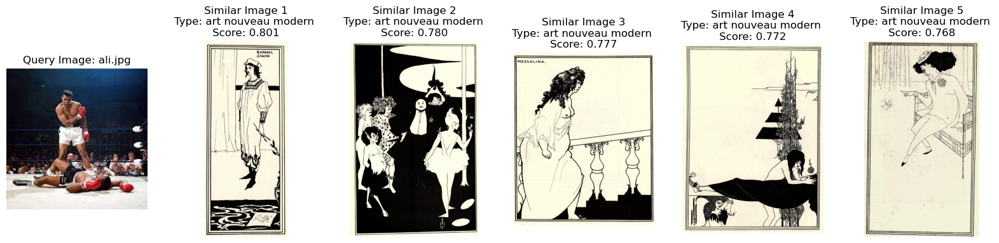

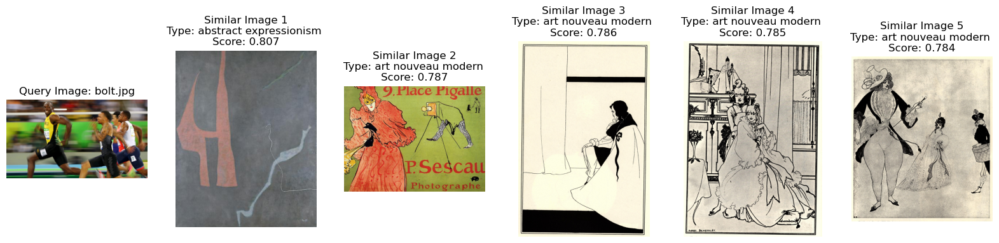

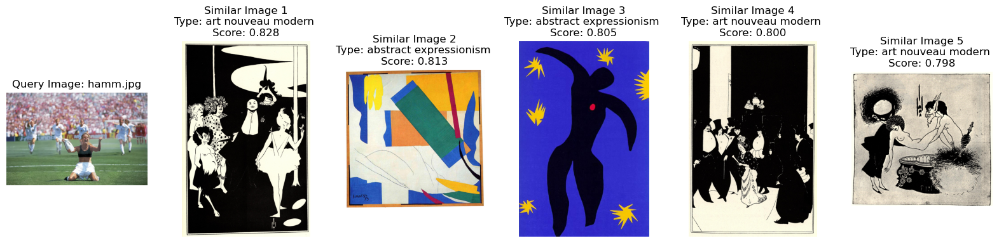

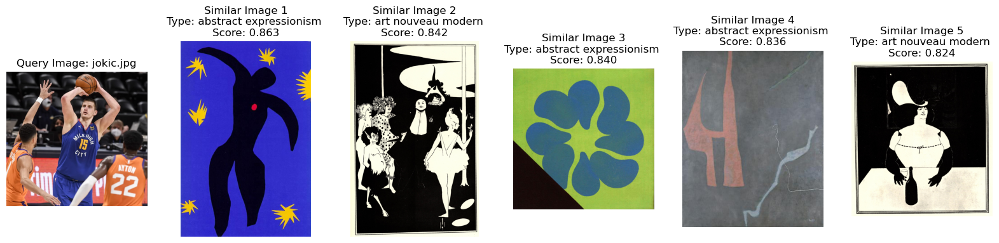

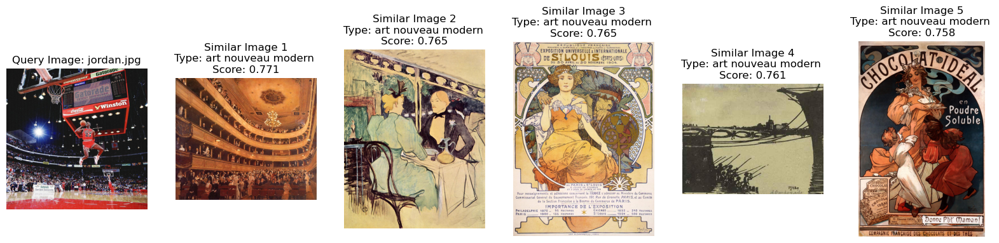

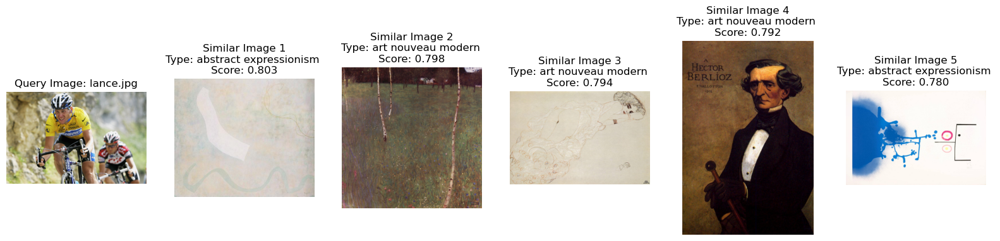

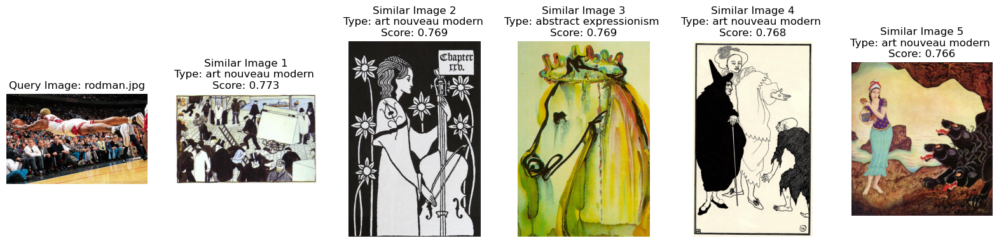

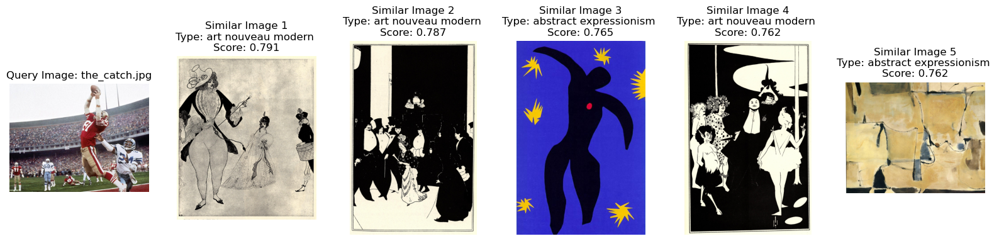

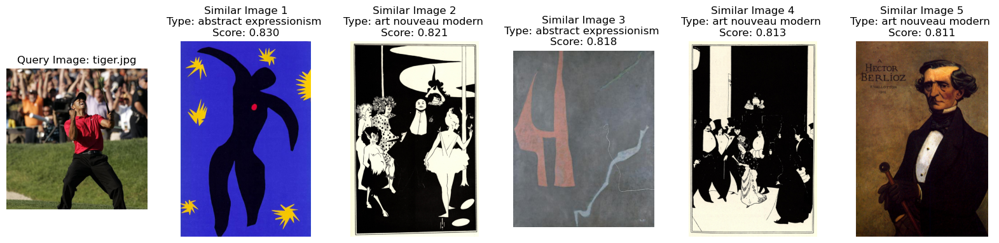

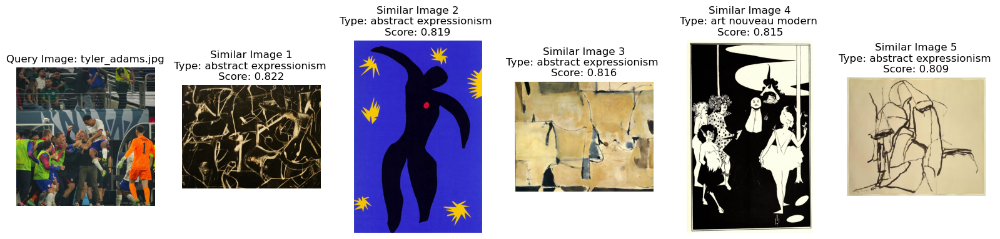

In [22]:
"""
Retrieve the most similar images to the edge detection images.
"""
#get edge detected test images:
edge_test_images = [os.path.join('../data/edge-test-images', item) for item in os.listdir('../data/edge-test-images') if os.path.splitext(item)[-1]=='.jpg']

#get results now:
for image in edge_test_images:
    get_results(edge_vector_store, image, 'edge')

# Testing Data Augmentation of Training Data

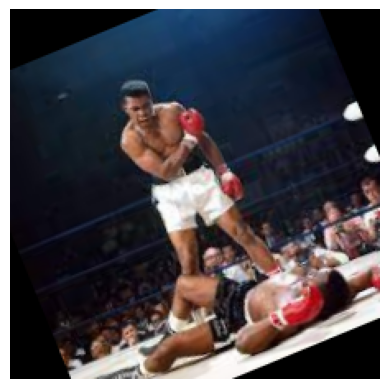

In [6]:
"""
Testing out some imgaug techniques on Ali.jpeg test image.
Following steps from documentation of imgaug:
https://imgaug.readthedocs.io/en/latest/source/examples_basics.html
"""
import imgaug as ia
import imgaug.augmenters as iaa

aug_seq = iaa.Sequential([
    iaa.Fliplr(0.5), # horizontal flips
    iaa.Crop(percent=(0, 0.1)), # random crops
    # Apply affine transformations to each image.
    # Scale/zoom them, translate/move them, rotate them and shear them.
    iaa.Affine(
        rotate=(-25, 25)
    )
], random_order=True) # apply augmenters in random order

ali = plt.imread('../data/test-images/ali.jpg')
aug_test = aug_seq(image = ali)
plt.imshow(aug_test)
plt.axis('off')
plt.show()

In [13]:
testingg = np.array(
    [ali for _ in range(4)],
    dtype=np.uint8
)
aug_imgs_test = augment_img('../data/test-images/ali.jpg')

aug_imgs, path  = aug_imgs_test

for i, aug_img in enumerate(aug_imgs):
    #print(aug_img.shape)
    imageio.imwrite(f'{aug_image_path}/{i}_ali.jpg', aug_img)

In [8]:
"""
Create Augmented image folder to store
"""

#get original images paths
images_paths = [os.path.join('images', item) for item in os.listdir('images') if os.path.splitext(item)[-1]=='.jpg']
images_paths[:5]

#create 'aug-images' directory to store
aug_image_path = 'aug-images'
if os.path.exists(aug_image_path):
    shutil.rmtree(aug_image_path)
os.makedirs(aug_image_path)

In [14]:
"""
Define function that will take an image, read it, augment it multiple times with same sequence (randomly
augmented however so won't be same augmentation per image).

So, each image will have about 4 different augmentations to it.

Will use Pool() to parallel process abstract images later.
"""

#define function to augment
def augment_img(image_path):

    #define sequence
    import imgaug.augmenters as iaa
    import imageio.v2 as imageio
    import numpy as np

    aug_seq = iaa.Sequential([
    iaa.Fliplr(0.5), # horizontal flips
    iaa.Crop(percent=(0, 0.1)), # random crops
    # Small gaussian blur with random sigma between 0 and 0.5.
    # But we only blur about 50% of all images.
    iaa.Sometimes(
        0.5,
        iaa.GaussianBlur(sigma=(0, 0.5))
    ),
    # Strengthen or weaken the contrast in each image.
    iaa.LinearContrast((0.75, 1.5)),
    # Add gaussian noise.
    # For 50% of all images, we sample the noise once per pixel.
    # For the other 50% of all images, we sample the noise per pixel AND
    # channel. This can change the color (not only brightness) of the
    # pixels.
    iaa.AdditiveGaussianNoise(loc=0, scale=(0.0, 0.05*255), per_channel=0.5),
    # Make some images brighter and some darker.
    # In 20% of all cases, we sample the multiplier once per channel,
    # which can end up changing the color of the images.
    iaa.Multiply((0.8, 1.2), per_channel=0.2),
    # Apply affine transformations to each image.
    # Scale/zoom them, translate/move them, rotate them and shear them.
    iaa.Affine(
        scale={"x": (0.8, 1.2), "y": (0.8, 1.2)},
        translate_percent={"x": (-0.2, 0.2), "y": (-0.2, 0.2)},
        rotate=(-25, 25),
        shear=(-8, 8)
        )], random_order=True)

    #read image to augment
    img = imageio.imread(image_path)
    aug_mult_imgs = aug_seq(images = [img for _ in range(2)])

    return aug_mult_imgs, image_path

In [15]:
"""
Using Pool() to parallel process all images through data augmentation
"""

#get cpu count:
cpu_count = mp.cpu_count()

#make pool of workers
pool = mp.Pool(processes=cpu_count)

#parallel preprocess and save into edge_image folder
for aug_imgs, path in pool.starmap(augment_img, [(path,) for path in images_paths]):
    for i, aug_img in enumerate(aug_imgs):
        imageio.imwrite(f'{aug_image_path}/{i}_{os.path.basename(path)}', aug_img)

#close pool of workers
pool.close()
pool.join()
